### imports

In [9]:
from SEAM.utils import *
import SEAM
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import cv2
from sklearn.decomposition import PCA
import re
from scipy.spatial.distance import *
from skimage import color


### settings

In [2]:
sns.set_style('white')
# font = {'family' : 'normal',
#         'weight' : 'bold',
#         'size'   : 2}

# matplotlib.rc('font', **font)
# matplotlib.rcParams.update({'font.size': 2})

import matplotlib.pyplot as plt

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title






### functions

In [17]:
import imageio
from scipy import ndimage as ndi
def load_segment(sample,mode):
    base_path = '/home/yzy/bioSIMS/data/Segment_{0}/'.format(mode)
    im = imageio.imread(base_path+'{0}.png'.format(sample))
#     print(im.shape)
    if mode=='Human_256':
        im_bool = im[:,:,3].copy()
        im_bool[im_bool>0]=1
    else:
        im_bool = im[:,:,0].copy()
        im_bool[im_bool>0]=1
    im_bool = im_bool.astype('int64')
    im_int,_ = ndi.label(im_bool)
    return im_bool,im,im_int

### get Human mask

In [61]:
Human_mask_dict = {}

In [66]:
with open('/home/yzy/bioSIMS/data/Segment_Cut/Cut_256.pickle', 'rb') as handle:
    Cut_mask_dict = pickle.load(handle)

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


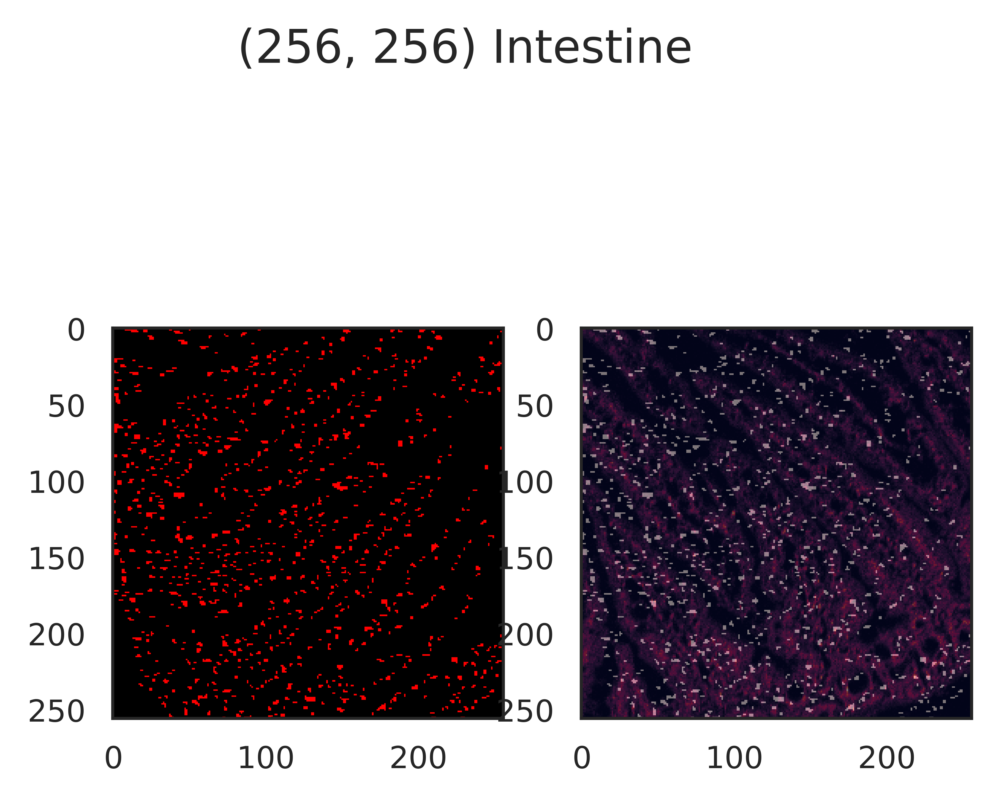

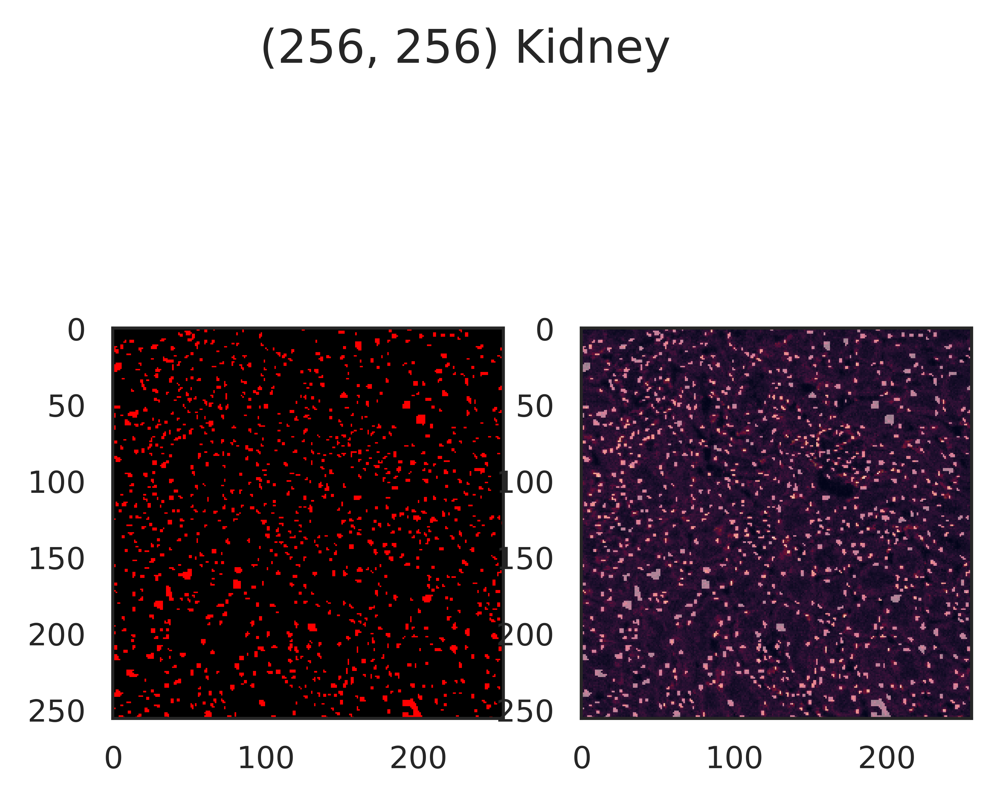

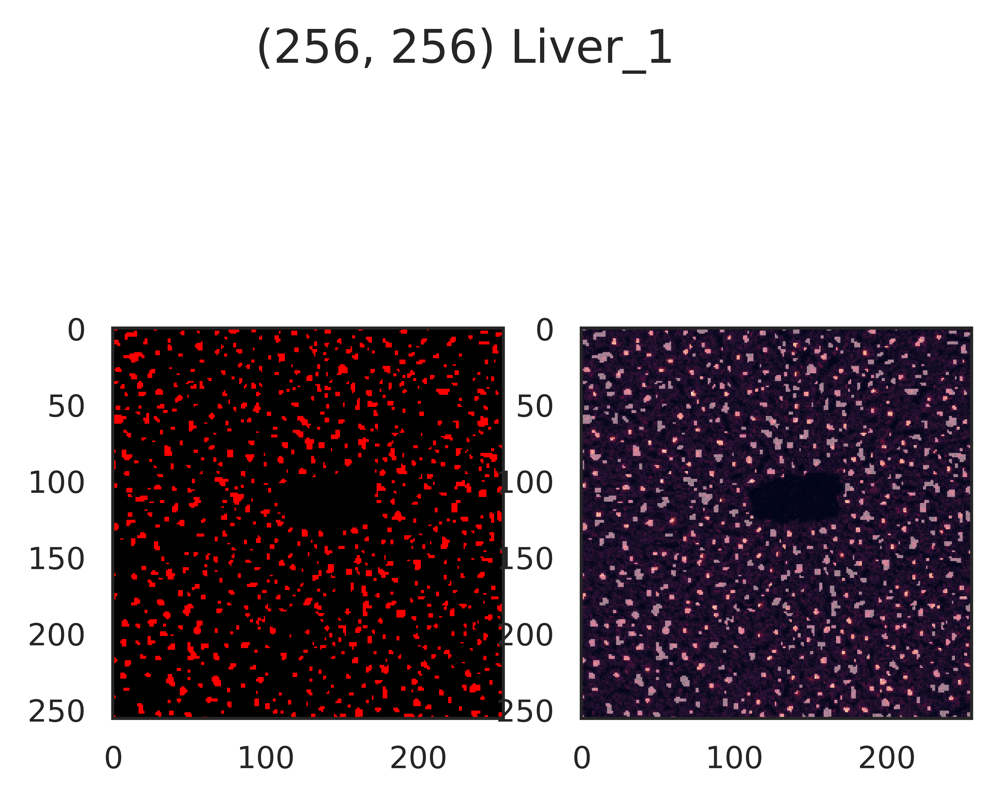

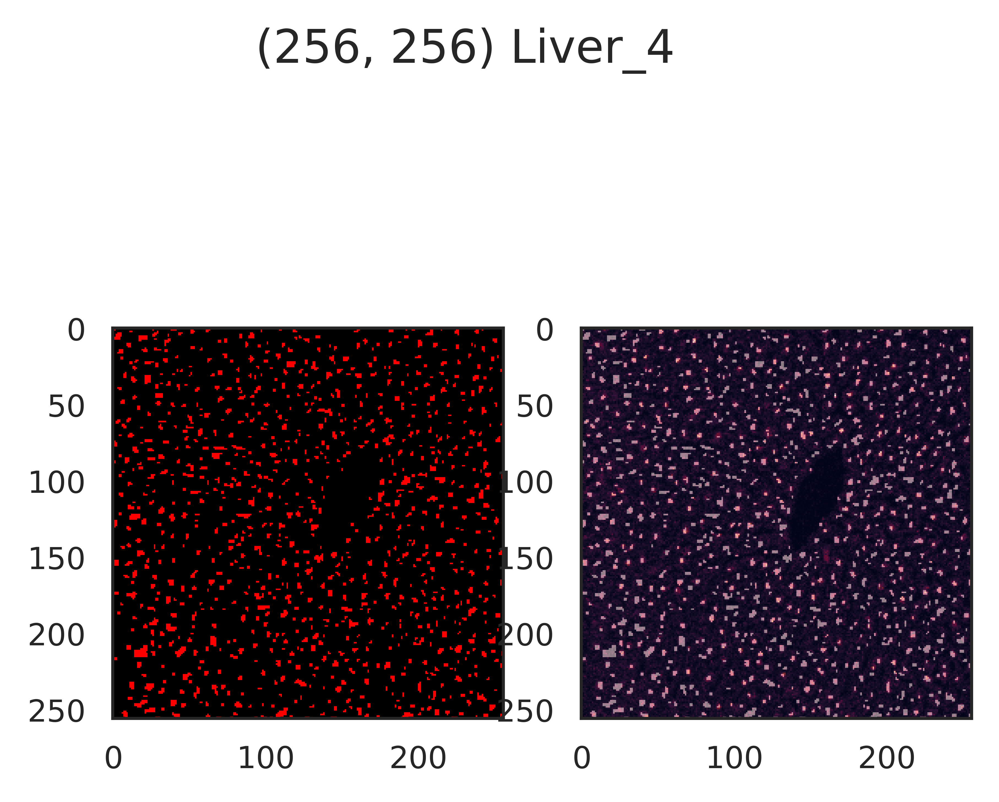

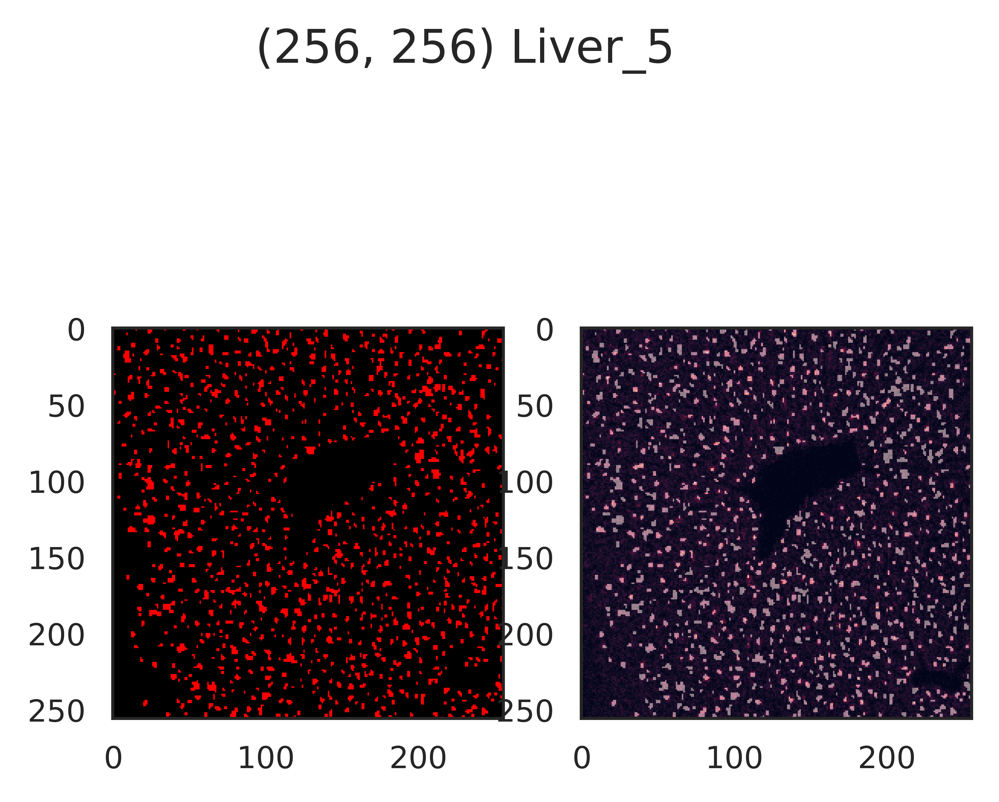

...

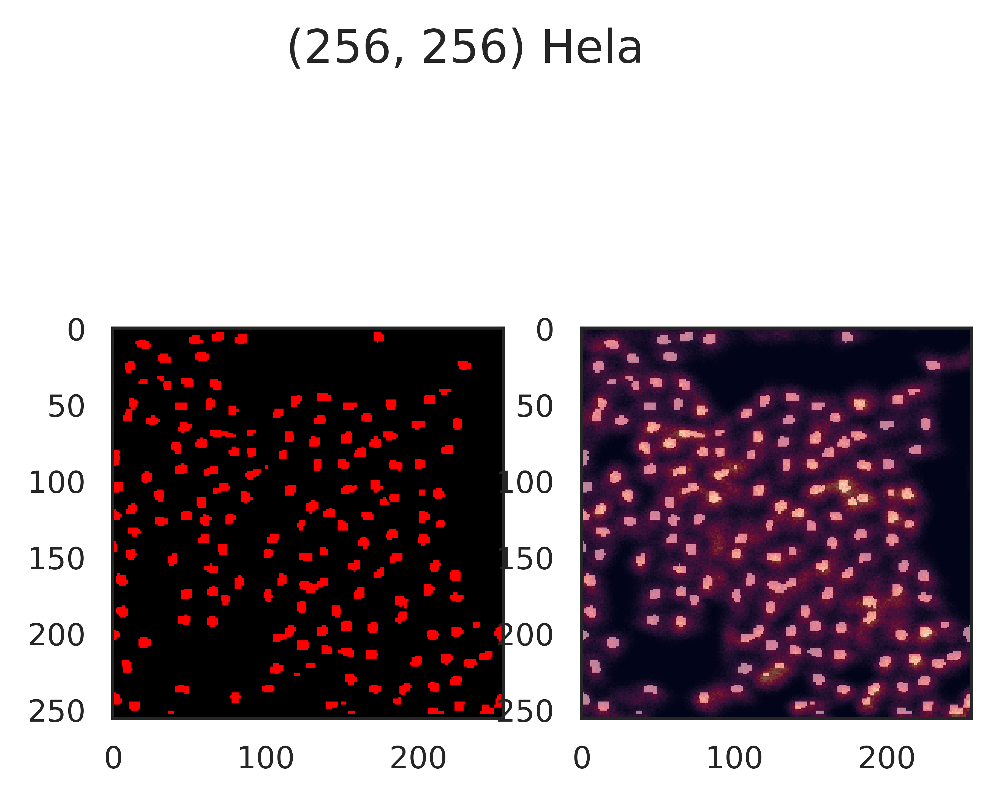

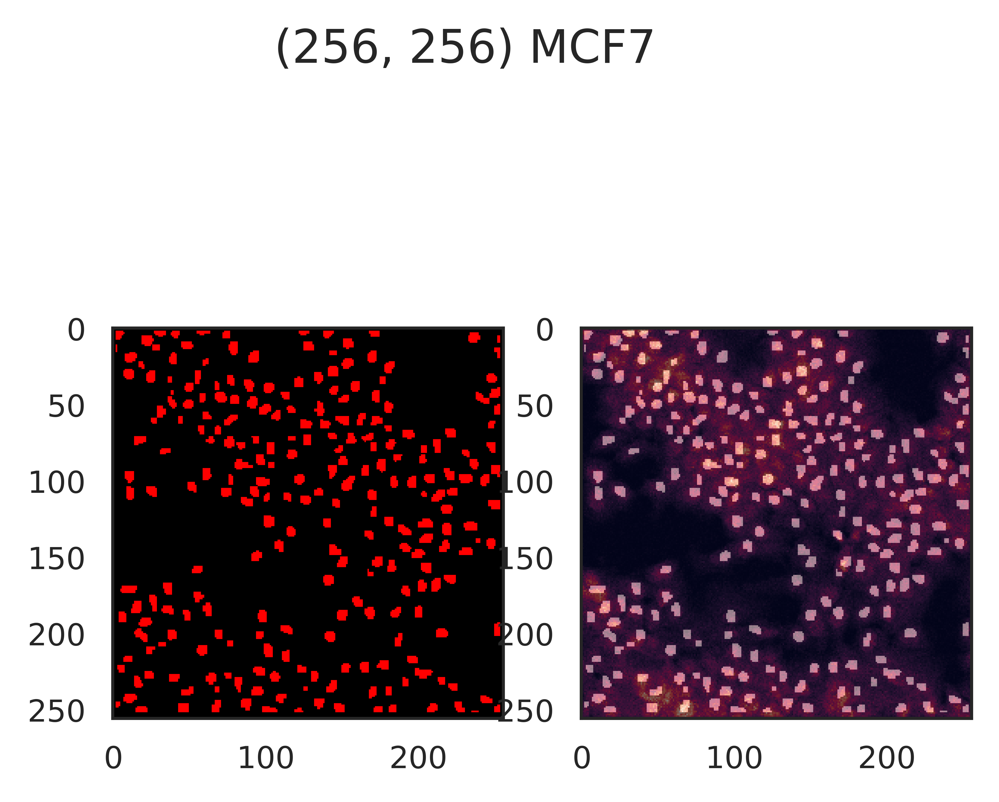

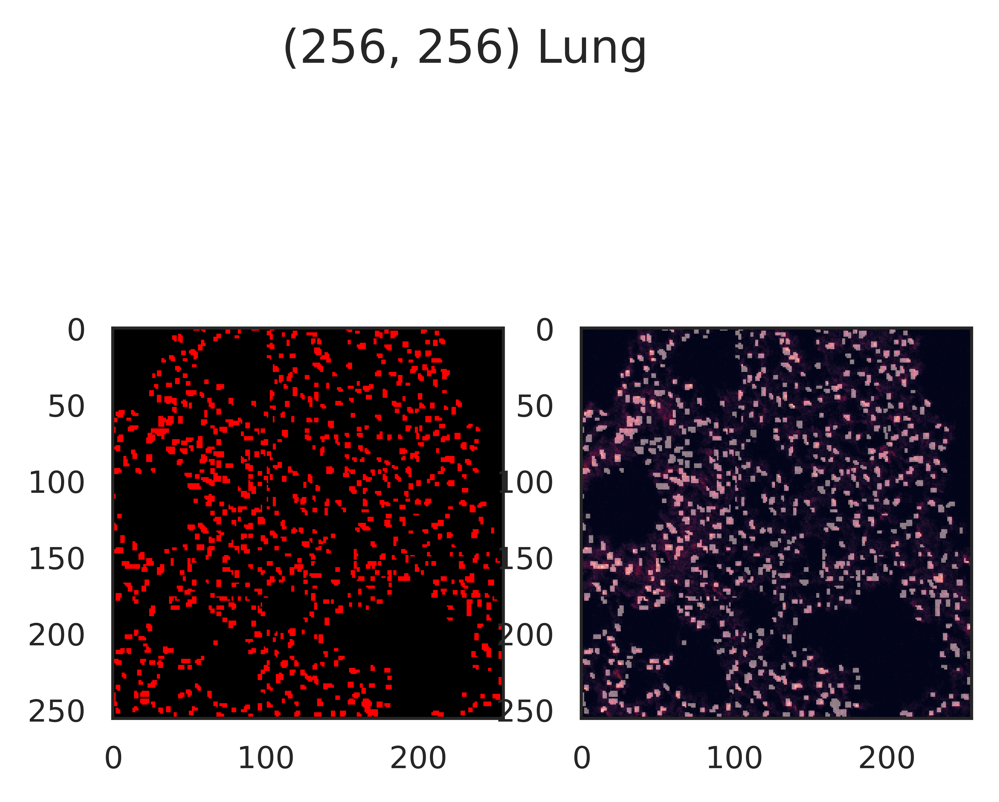

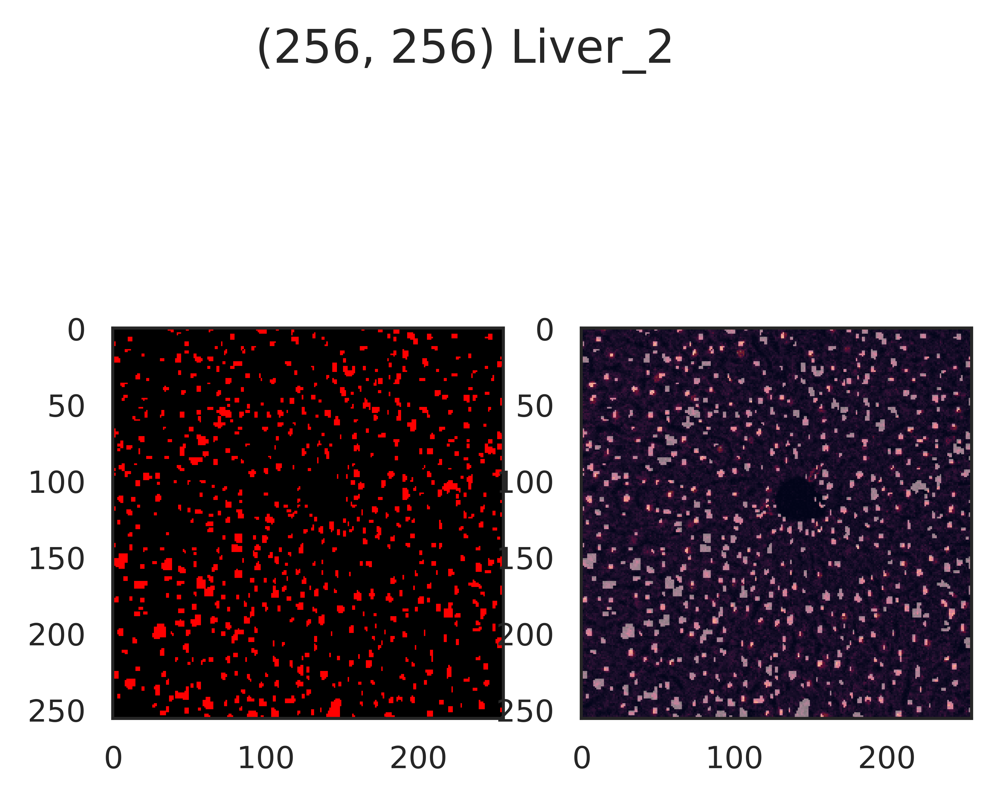

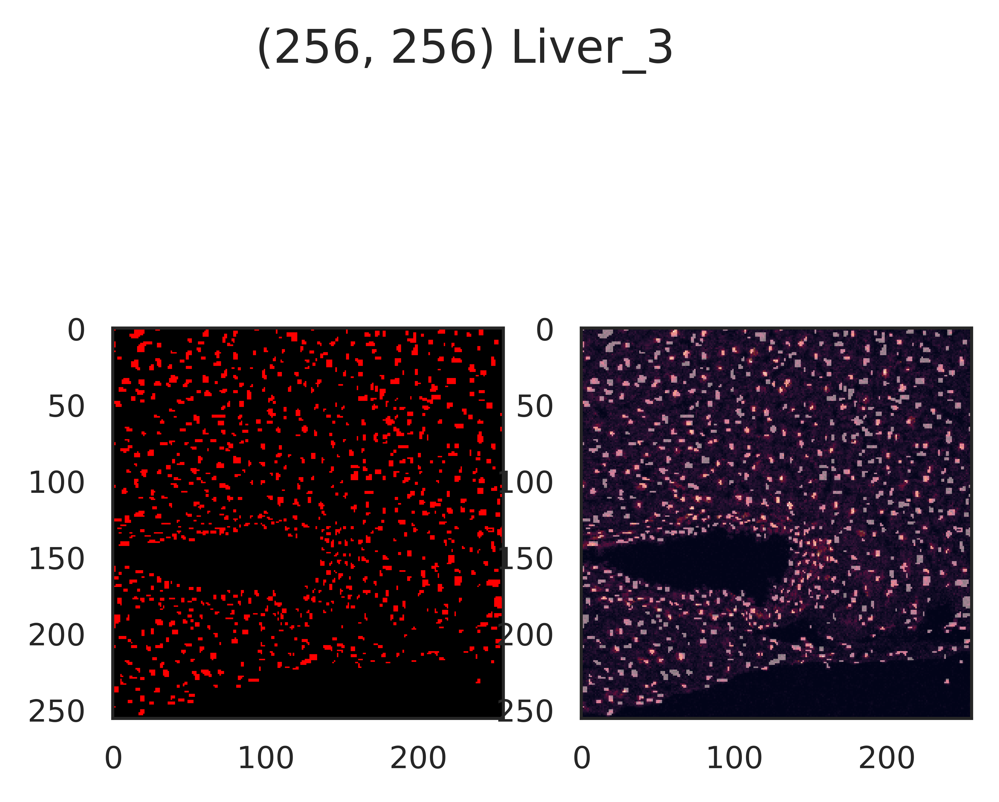

In [67]:
for tissue in tissue_adenine_dict.keys():
# tissue = 'A549'
    
#     Human_256_bool,Human_256,human_256_int = load_segment(tissue+'-01','Human_256')
#     Human_mask_dict[tissue] = Human_256_bool
    Human_256_bool = Cut_mask_dict[tissue]
    SIMS_256 = tissue_adenine_dict_new[tissue]
    
    fig,axes = plt.subplots(1,2)
    axes[0].imshow(color.label2rgb(Human_256_bool,bg_label=0))

    axes[1].imshow(SIMS_256)
    axes[1].imshow(Human_256_bool,alpha=0.5)
    fig.suptitle('{1} {0}'.format(tissue,str(Human_256_bool.shape)))        
    # axes[2].imshow(Cut_256_int)


In [74]:
Cut_mask_dict_new = Cut_mask_dict.copy()

In [83]:
Cut_mask_dict_new['R4'] = to_show.copy()

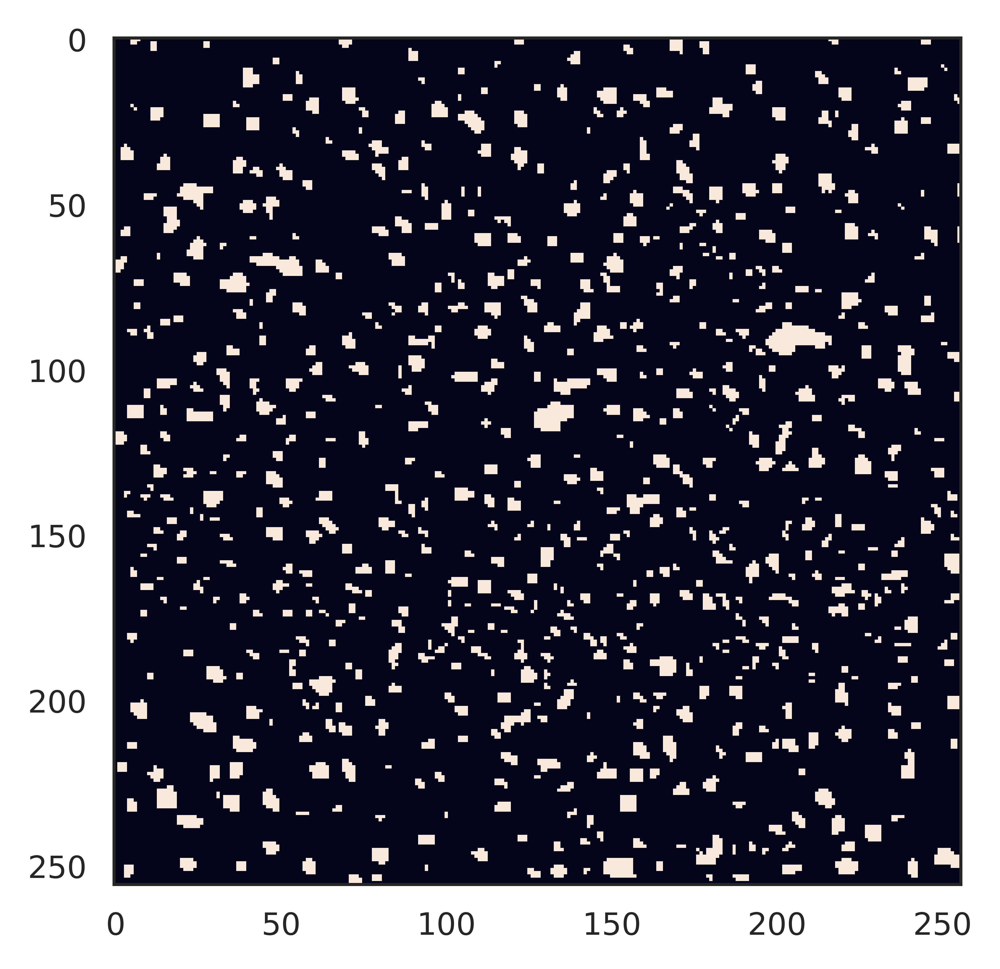

In [82]:
# to_show = tissue_adenine_dict_new['Intestine']
to_show = Cut_mask_dict['R4']
# plt.imshow(np.rot90(to_show))
to_show = np.rot90(to_show,3)
to_show = np.fliplr(to_show)
plt.imshow((to_show))

In [59]:
with open('/home/yzy/bioSIMS/data/Segment_SIMS/SIMS_256_rotation.pickle', 'wb') as handle:
    pickle.dump(tissue_adenine_dict_new, handle, protocol=pickle.HIGHEST_PROTOCOL)
    

In [63]:
with open('/home/yzy/bioSIMS/data/Segment_Human_256/Human_256.pickle', 'wb') as handle:
    pickle.dump(Human_mask_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
    

In [84]:
with open('/home/yzy/bioSIMS/data/Segment_Cut/Cut_256.pickle', 'wb') as handle:
    pickle.dump(Cut_mask_dict_new, handle, protocol=pickle.HIGHEST_PROTOCOL)
    